#**PROJECT TOPIC: OBJECT SEGMENTATION USING DEEP LEARNING BASED EDGE DETECTION (HED)**

# Abstract
This project explores object segmentation in images using deep learning-based edge detection, specifically the Holistically-Nested Edge Detection (HED) model. HED is employed to accurately detect edges, serving as a foundation for robust segmentation. In addition to HED, traditional edge detection methods like Canny are applied to compare results. The segmented edges are then post-processed using thresholding and connected component analysis, followed by false-color visualizations to highlight individual objects. The results demonstrate the effectiveness of HED in generating finer and more coherent boundaries compared to classical techniques, emphasizing its utility in modern computer vision tasks.


# Introduction
Edge detection and object segmentation are fundamental tasks in computer vision, with applications in medical imaging, autonomous driving, and surveillance. Traditional edge detectors like Canny and Sobel are limited by their sensitivity to noise and lack of semantic understanding. Recent advancements in deep learning have introduced more powerful models, such as Holistically-Nested Edge Detection (HED), which leverage convolutional neural networks to produce high-quality edge maps. This project implements and evaluates HED for object segmentation, comparing its performance with traditional methods.

**Objectives and Goals**
- Implement HED for edge detection.
- Compare HED with traditional Canny edge detection.
- Perform connected component labeling to identify and segment objects.
- Visualize the results using false color images.

# Related Work
The HED model was introduced by Xie and Tu in their 2015 paper, 'Holistically-Nested Edge Detection.' Unlike traditional edge detection techniques, HED utilizes deep supervision and side outputs in a VGG-16 network architecture to enhance edge learning. Other classical techniques such as Canny and Sobel filters are known for their simplicity but suffer in complex scenarios. Object segmentation methods using HED have since gained popularity due to their ability to detect semantically meaningful edges.

# Methodology
The workflow for this project is as follows:
1. Load and preprocess five sample images.
2. Apply traditional Canny and Auto-Canny edge detection techniques.
3. Use the HED model (pretrained) to generate deep learning-based edge maps.
4. Perform thresholding on the HED outputs using Gaussian blur and Otsu’s method.
5. Use connected component labeling to identify and color different segmented regions.
6. Overlay centroids on segmented objects to visualize spatial distribution.

#Implementation
The implementation is done using Python with OpenCV, NumPy, and Matplotlib. Google Colab was used for convenient GPU access and visualization. The HED model was loaded using OpenCV's deep learning module, with a custom crop layer registered to correct image misalignments during forward pass. Results were stored and visualized at each step.

**Code Explanation**

The code is divided into several sections:
1.	Importing Libraries
- Necessary libraries such as NumPy, OpenCV, and Matplotlib are imported.
2.	Cropping Part of the Image
- A custom crop layer is implemented to ensure the results are not shifted.
3.	Reading and Displaying Images
- Images are read and displayed using OpenCV and Matplotlib.
4.	Edge Detection
- Both Canny and HED edge detection are applied to the images.
5.	Blob Preprocessing
- Images are preprocessed using blobFromImage for HED.
6.	Connected Component Labeling
- Connected component labeling is performed on the thresholded edge maps.
- False color images are created to visualize the segmented objects.

# Results and Discussion
The Canny and Auto-Canny edge maps provided coarse outlines with varying sensitivities to image gradients. The HED-based edge maps were significantly more accurate and coherent, revealing object boundaries that were often missed by classical methods. Thresholding further refined the edges into binary masks, enabling clear object segmentation. Connected component labeling and false color mapping visually distinguished individual objects. Centroid plotting added a spatial analysis component to object distribution.

# Conclusion
This project demonstrates the power of deep learning-based methods like HED in object segmentation tasks. Compared to traditional approaches, HED provided more precise and context-aware edge maps. The addition of thresholding, connected component labeling, and centroid analysis further enriched the segmentation pipeline.

**Future Work and Improvements**
- Explore other deep learning-based edge detection methods.
- Improve the segmentation accuracy by fine-tuning the HED model.
- Future work may explore real-time applications or combining HED with other semantic segmentation networks.

# References
- Lecture Notes

- Original HED paper: Xie, Saining, and Zhuowen Tu. “Holistically-Nested Edge Detection.” arXiv preprint arXiv:1504.06375 (2015). [Link](https://arxiv.org/pdf/1504.06375.pdf)

- Proto Text File [GitHub](https://github.com/ashukid/hed-edge-detector/blob/master/deploy.prototxt)

- Pretained Model [GitHub](https://github.com/s9xie/hed)

- Edge Detection [YouTube](https://www.youtube.com/watch?v=rj8WOyw280k)

- Object segmentation [Youtube](https://www.youtube.com/watch?v=un7QvhXZ_G4&t=926s)

- Microsoft Copilot: Querry "I want crop layer to used in my object segmentation using HED so that the results images wont be shifted to the right and bottom"

In [ ]:
# Import necessary libraries
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow
from skimage import measure
import matplotlib.pyplot as plt

Define the crop layer.

There is a Crop layer that the HED network uses which is not implemented by default so we need to provide our own implementation of this layer. Without the crop layer, the final result will be shifted to the right and bottom.

I asked Microsoft Copilot for the crop code. "I want crop layer to used in my object segmentation using HED so that the results images wont be shifted to the right and bottom"

In [ ]:
#cropping part of the image
class CropLayer(object):
    def __init__(self, params, blobs):
        # initialize our starting and ending (x, y)-coordinates of
        # the crop
        self.startX = 0
        self.startY = 0
        self.endX = 0
        self.endY = 0

    def getMemoryShapes(self, inputs):
        (inputShape, targetShape) = (inputs[0], inputs[1])
        (batchSize, numChannels) = (inputShape[0], inputShape[1])
        (H, W) = (targetShape[2], targetShape[3])

        # compute the starting and ending crop coordinates
        self.startX = int((inputShape[3] - targetShape[3]) / 2)
        self.startY = int((inputShape[2] - targetShape[2]) / 2)
        self.endX = self.startX + W
        self.endY = self.startY + H

        # return the shape of the volume
        return [[batchSize, numChannels, H, W]]

    def forward(self, inputs):
        # use the derived (x, y)-coordinates to perform the crop
        return [inputs[0][:, :, self.startY:self.endY,
                self.startX:self.endX]]

### Register the crop layer

Registering the crop layer with the model is essential because it allows the deep learning framework (like OpenCV's DNN module) to recognize and use the custom layer during the model's execution.

In [ ]:
# register our crop layer with the model
cv2.dnn_registerLayer("Crop", CropLayer)

The pre-trained model that OpenCV uses has been trained in Caffe framework.
I download it from GitHub

HED is built on top of publicly available implementation of FCN and DSN and is implemented using the publicly Caffe library.

This Caffe model is encoded into two file:
1. A prototxt file: A text Caffe JSON file with the model definition.
2. Pre-trained Caffe model: Neural Network Weights.

In [ ]:
# Define the network and load the pre-treained model
protoPath = "/content/deploy.prototxt"
modelPath = "/content/hed_pretrained_bsds.caffemodel"
net = cv2.dnn.readNetFromCaffe(protoPath, modelPath)

# register our crop layer with the model
cv2.dnn_registerLayer("Crop", CropLayer)

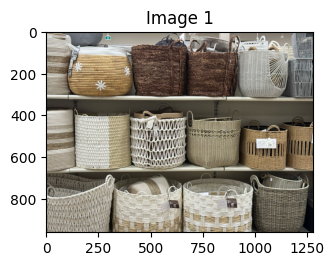

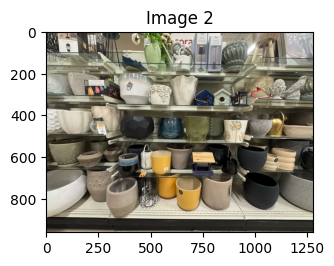

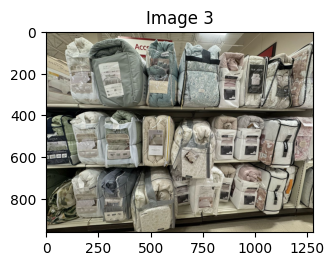

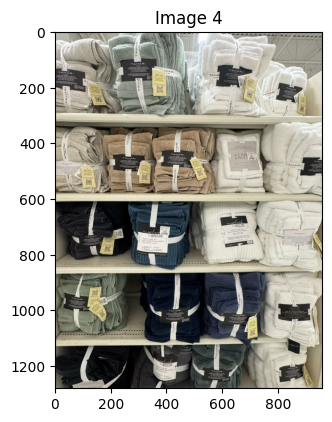

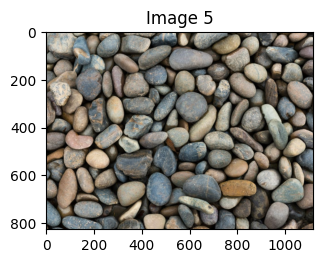

In [ ]:
# Read the images individually in a loop
image_paths = ["/content/images/Image 1.jpg", "/content/images/Image 2.jpg",
                "/content/images/Image 3.jpg", "/content/images/Image 4.jpg",
                "/content/images/Image 5.jpg"]

# Access all the 5 images for display if needed
images = [cv2.imread(path) for path in image_paths]
for i in range(len(images)):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, len(images), i + 1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)) # Convert BGR to RGB for plt.imshow
    plt.title(f"Image {i + 1}")
    plt.show()

(H, W) = images[3].shape[:2]

# Canny Edge Detection

Is one of the many traditional edge detection which is popular and effective edge detection algorithm in image processing.

This is performed to help compare the traditional edge detection like Canny to the Modern one like HED

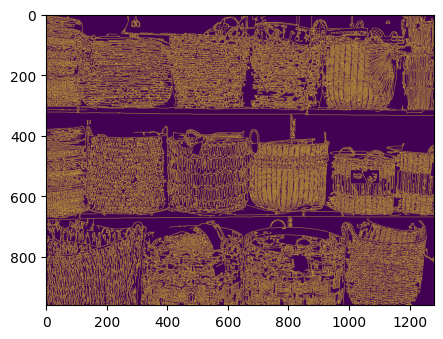

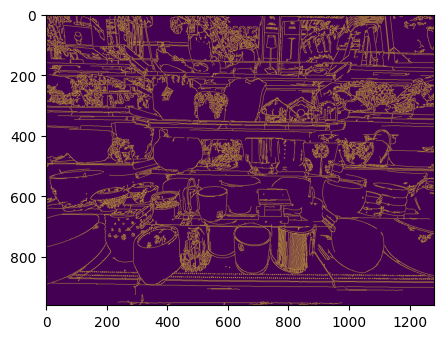

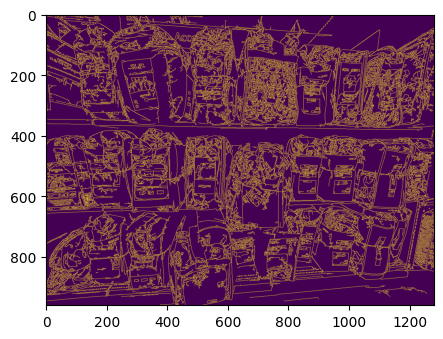

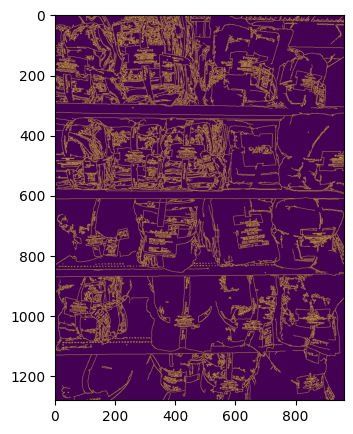

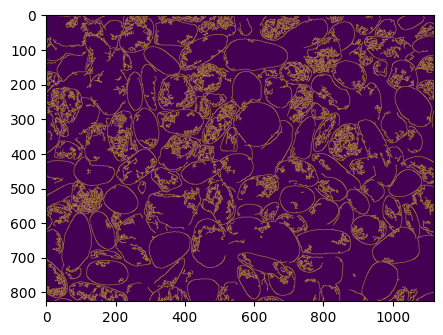

In [ ]:
# Canny
for image in images:
    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    canny_edge = cv2.Canny(gray, 50, 300)  # Apply Canny edge detection
    plt.figure(figsize=(5, 5))
    plt.imshow(canny_edge)  # Display the edge map
    plt.show()

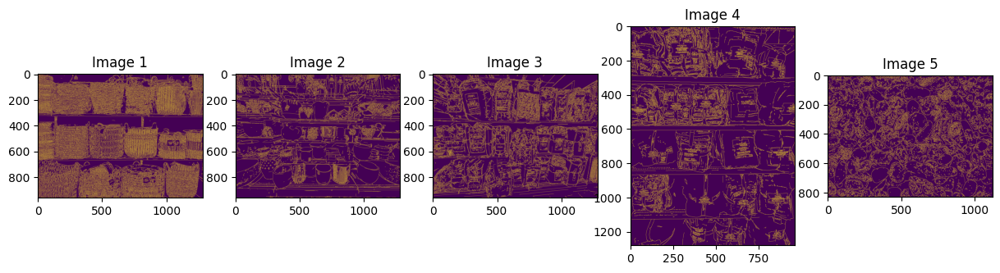

<Figure size 2000x2000 with 0 Axes>

In [ ]:
# Create a figure and subplots
fig, axes = plt.subplots(1, len(images), figsize=(15, 10))

# Loop through images and apply Auto Canny edge detection
for i, image in enumerate(images):
    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Auto Canny Edge Detection for current image
    sigma = 0.3
    median = np.median(gray)  # Calculate median for the grayscale image
    lower = int(max(0, (1.0 - sigma) * median))
    upper = int(min(255, (1.0 + sigma) * median))
    auto_canny = cv2.Canny(gray, lower, upper)

    # Display the edge map in the corresponding subplot
    axes[i].imshow(auto_canny)
    axes[i].set_title(f"Image {i + 1}")

# Adjust subplot spacing and display the figure
plt.figure(figsize=(20, 20))
plt.tight_layout()
plt.show()


Steps for edge detection using HED:
    
1. Define the network and load the pre-trained model.​
2. Register the crop layer with the network.
3. Create blob from the image (preprocessed image​).
4. Load pretrained model (you need both the proto text and caffe model files)​
5. Pass the blob image through model​ (forward pass).
6. Get output​
7. Perform connected component based labeling.
8. Extract and display parameters

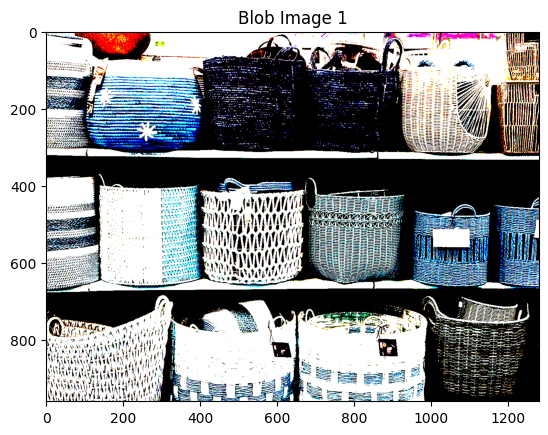

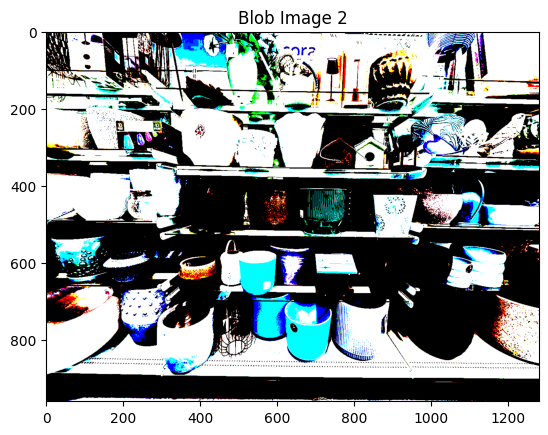

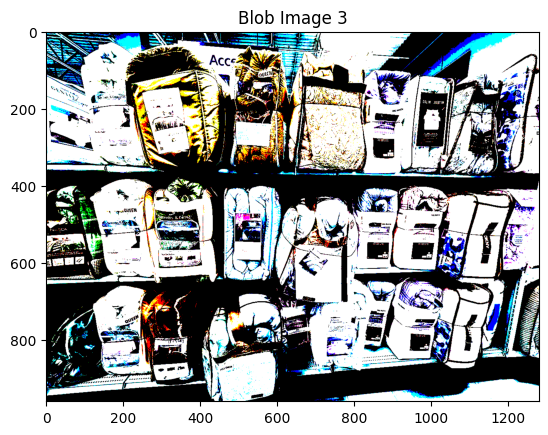

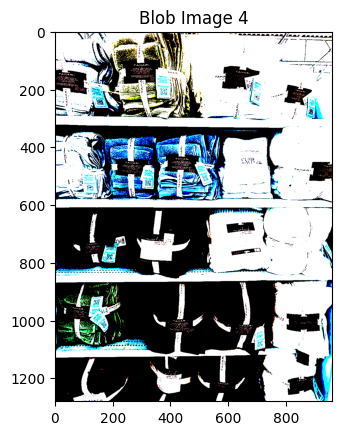

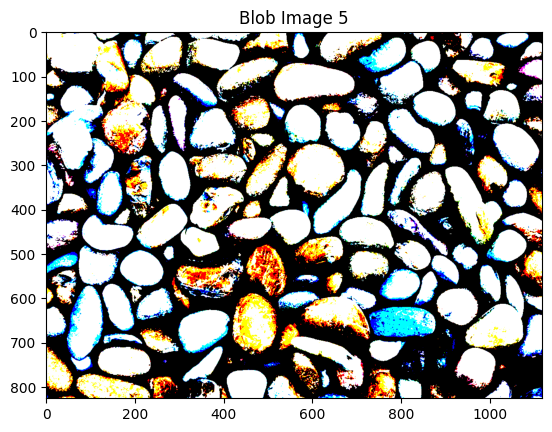

In [ ]:
# Blob preprocessing and display for each image
for i, image in enumerate(images):
    (H, W) = image.shape[:2]
    # Calculate the mean values for each channel directly from the image
    mean_r = np.mean(image[:, :, 0])  # Mean of red channel
    mean_g = np.mean(image[:, :, 1])  # Mean of green channel
    mean_b = np.mean(image[:, :, 2])  # Mean of blue channel

    blob = cv2.dnn.blobFromImage(image, scalefactor=0.7, size=(W, H),
                                 # Pass the calculated mean values as a tuple
                                 mean=(mean_r, mean_g, mean_b),
                                 swapRB=False, crop=False)

    # View image after preprocessing (blob)
    blob_for_plot = np.moveaxis(blob[0, :, :, :], 0, 2)
    plt.figure()
    plt.imshow(blob_for_plot)
    plt.title(f"Blob Image {i + 1}")

plt.show()

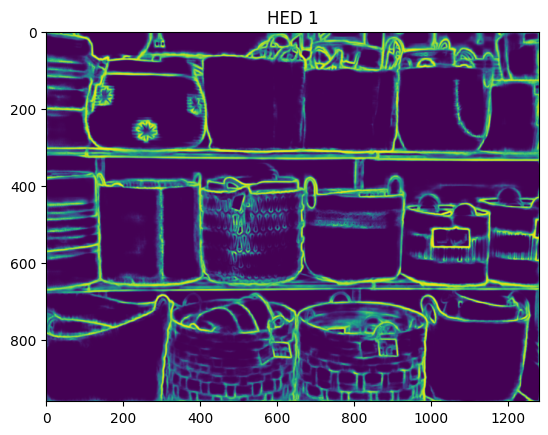

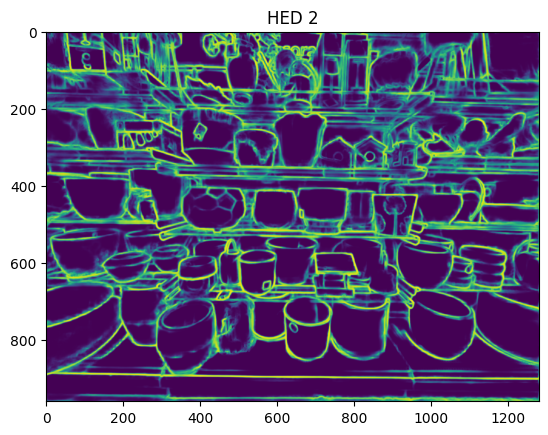

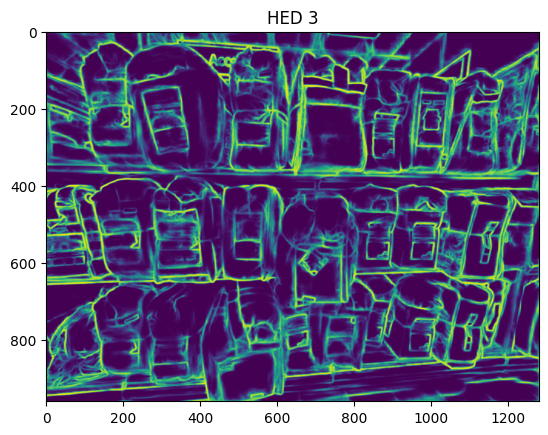

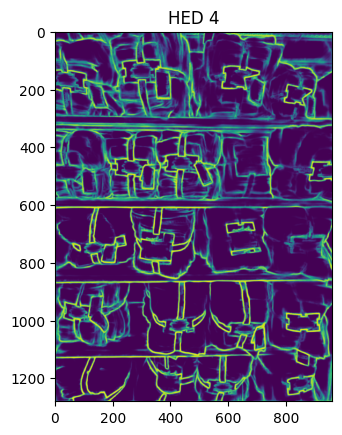

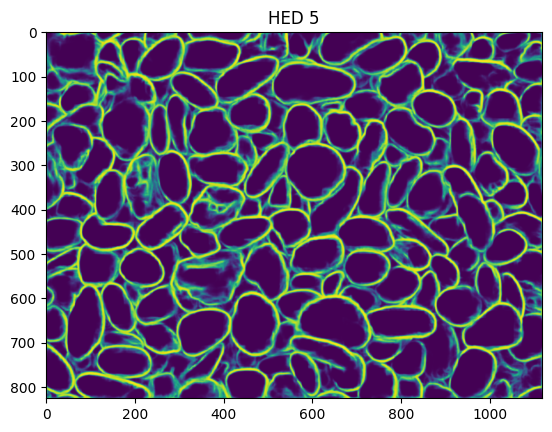

In [ ]:
# Indentation is corrected using 4 spaces
for i, image in enumerate(images):
    (H, W) = image.shape[:2]
    # Calculate the mean values for each channel directly from the image
    mean_r = np.mean(image[:, :, 0])  # Mean of red channel
    mean_g = np.mean(image[:, :, 1])  # Mean of green channel
    mean_b = np.mean(image[:, :, 2])  # Mean of blue channel


    blob = cv2.dnn.blobFromImage(image, scalefactor=1.2, size=(W, H),
                                 # Pass the calculated mean values as a tuple
                                 mean=(mean_r, mean_g, mean_b),
                                 swapRB=False, crop=False)

    net.setInput(blob)  # Set input for the network
    hed = net.forward() # Perform a forward pass
    hed = hed[0, 0, :, :] # Get the output
    hed = (255 * hed).astype("uint8") # Scale the output to 0-255 and convert to uint8

    plt.figure()
    plt.imshow(hed)
    plt.title(f"HED {i + 1}")

plt.show() # Display the figures after the loop is finished

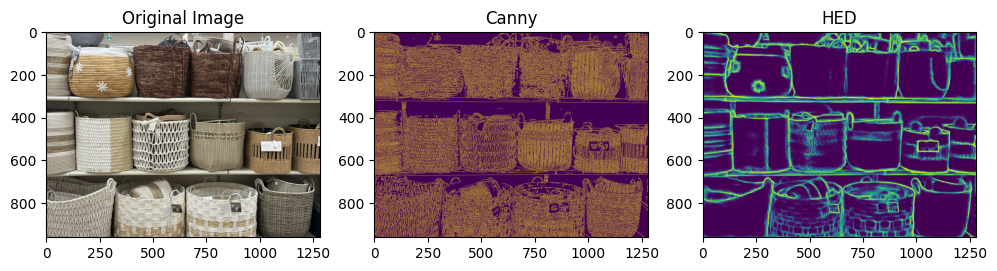

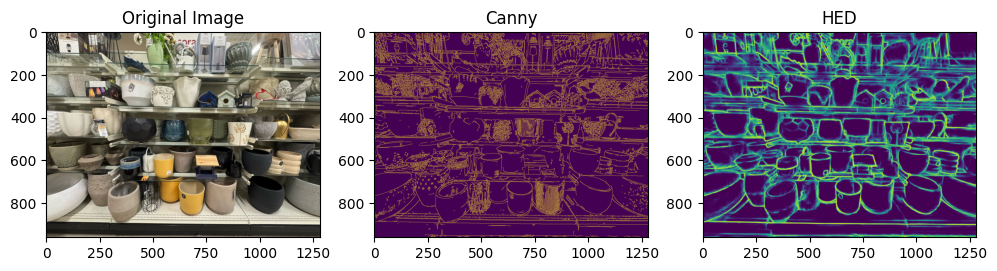

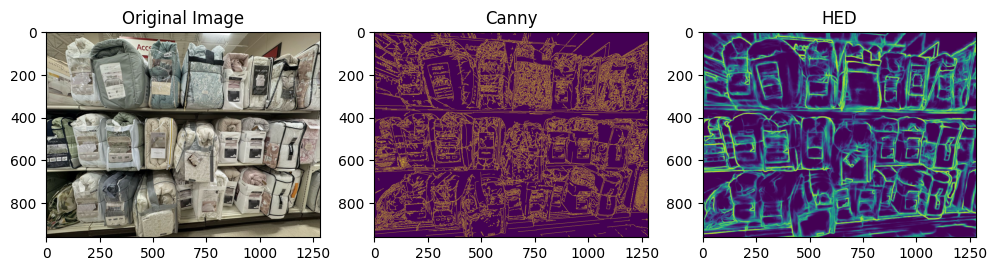

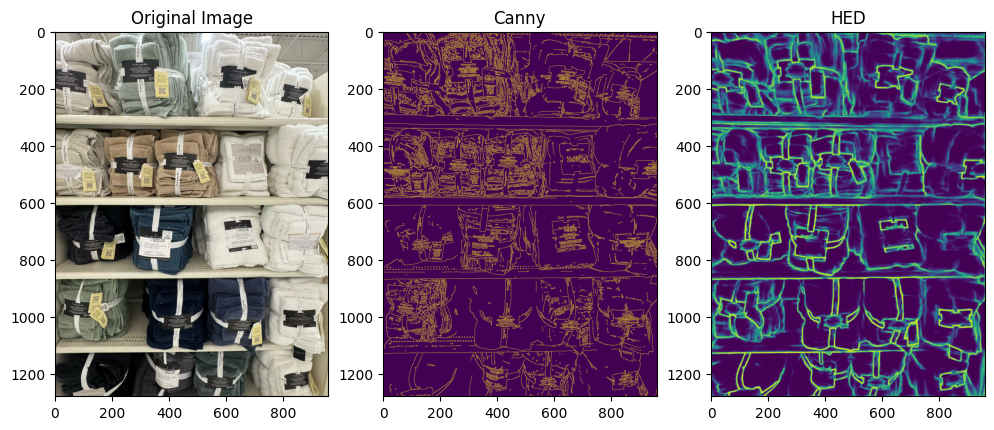

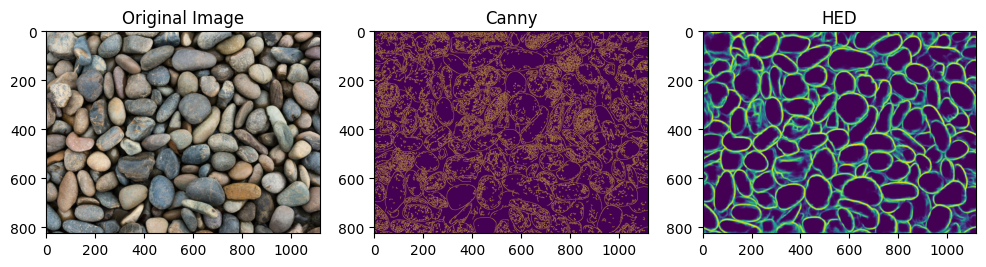

In [ ]:
# Process images to get HED edge maps
hed_results = []  # Create an empty list to store HED results for all images
auto_canny_results = [] #create a list to store canny results

for image in images:
    (H, W) = image.shape[:2]
    # Calculate the mean values for each channel
    mean_r = np.mean(image[:, :, 0])
    mean_g = np.mean(image[:, :, 1])
    mean_b = np.mean(image[:, :, 2])

    blob = cv2.dnn.blobFromImage(image, scalefactor=1.0, size=(W, H),
                                 mean=(mean_r, mean_g, mean_b),
                                 swapRB=False, crop=False)

    net.setInput(blob)  # Set input for the network
    hed = net.forward()  # Perform a forward pass
    hed = hed[0, 0, :, :]  # Get the output
    hed = (255 * hed).astype("uint8")  # Scale the output to 0-255 and convert to uint8

    hed_results.append(hed)  # Append the HED result to the list

    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Auto Canny Edge Detection for current image
    sigma = 0.3
    median = np.median(gray)  # Calculate median for the grayscale image
    lower = int(max(0, (1.0 - sigma) * median))
    upper = int(min(255, (1.0 + sigma) * median))
    auto_canny = cv2.Canny(gray, lower, upper)
    auto_canny_results.append(auto_canny)  # Append the Auto Canny result to the list

# Now you have a list 'hed_results' with HED edge maps for all images
# and a list 'auto_canny_results' with Auto Canny edge maps for all images


# Display the original image, Canny edge detection result, and HED result for each image
for i, image in enumerate(images):
    plt.figure(figsize=(12, 6))
    plt.subplot(131)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for plt.imshow
    plt.subplot(132)
    plt.title("Canny")
    plt.imshow(auto_canny_results[i])  # Display Canny result for the current image
    plt.subplot(133)
    plt.title("HED")
    plt.imshow(hed_results[i])  # Display HED result for the current image
    plt.show()

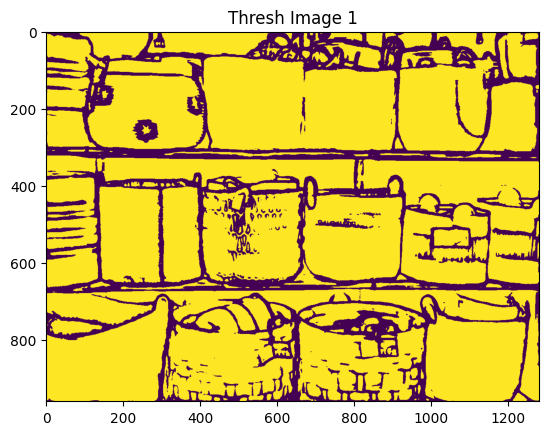

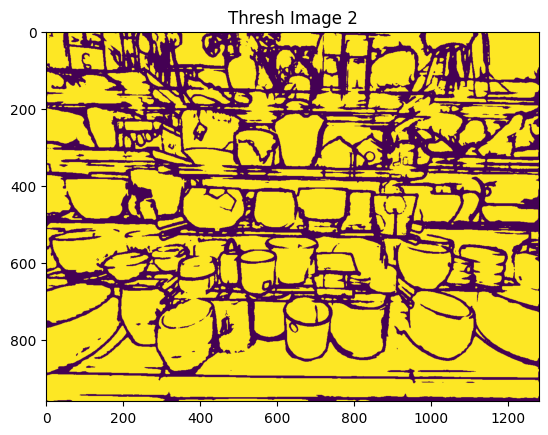

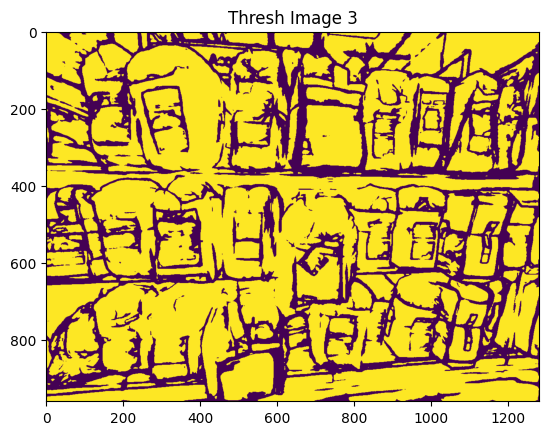

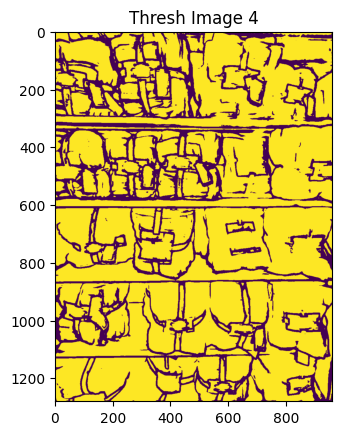

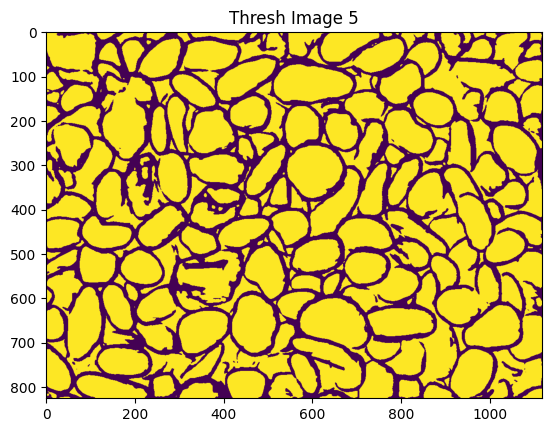

In [ ]:
# Function to create thresh for an image
def create_thresh(image):
    blur = cv2.GaussianBlur(image, (3, 3), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    return thresh

# Create thresh for all the images
thresh_results = [create_thresh(hed) for hed in hed_results]

# Display the thresh results
for i, thresh in enumerate(thresh_results):
    plt.figure()
    plt.imshow(thresh)
    plt.title(f"Thresh Image {i + 1}")
    plt.show()

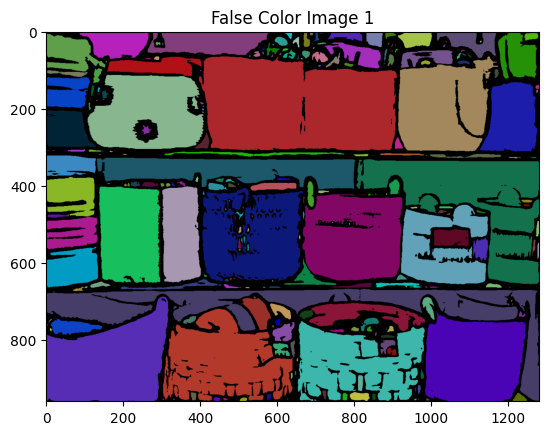

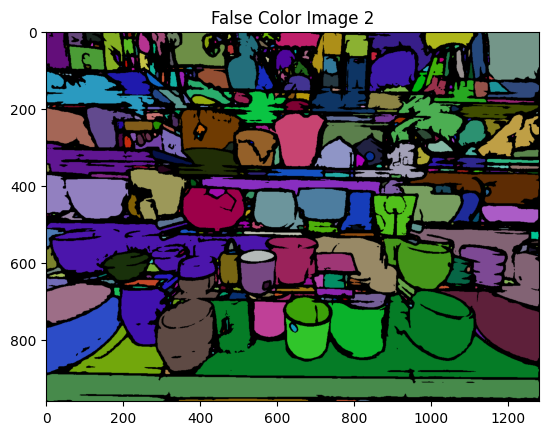

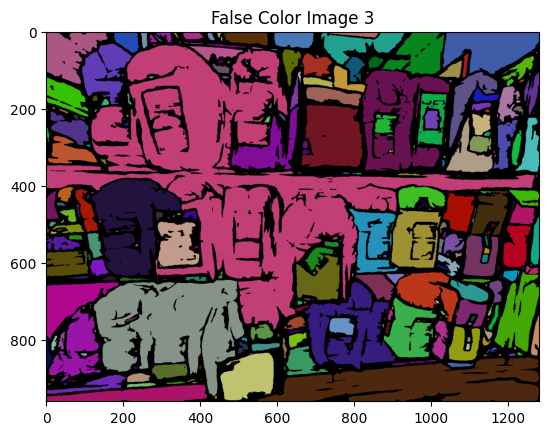

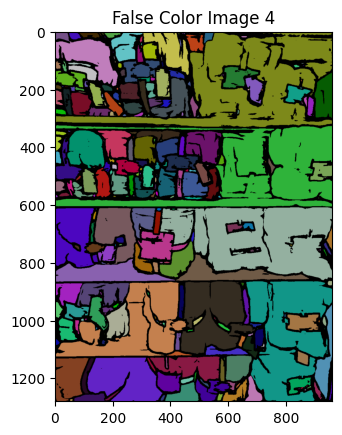

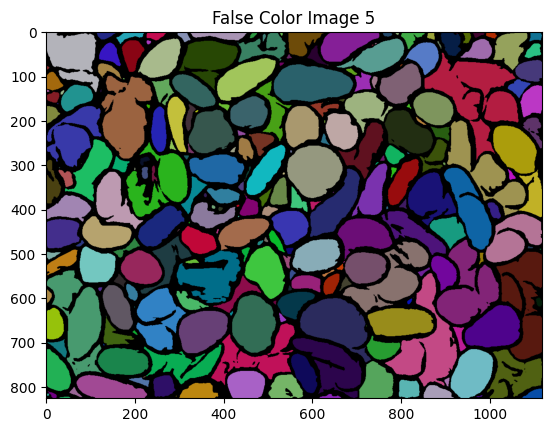

In [ ]:
# Perform connected component labeling and create false color images
false_color_images = []
for thresh in thresh_results:
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=4)

    # Create a false color image with black background and colored objects
    colors = np.random.randint(0, 200, size=(n_labels, 3), dtype=np.uint8)
    colors[0] = [0, 0, 0]
    false_colors = colors[labels]

    false_color_images.append(false_colors)

# Display the false color images
for i, false_colors in enumerate(false_color_images):
    plt.figure()
    plt.imshow(false_colors)
    plt.title(f"False Color Image {i + 1}")
    plt.show()

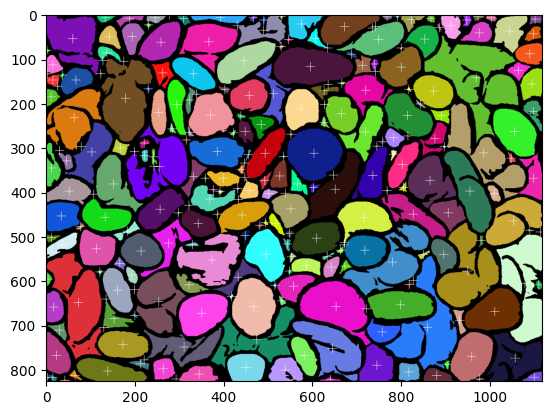

In [ ]:
# Connected component labeling
blur = cv2.GaussianBlur(hed_results[i], (3, 3), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
plt.imshow(thresh)

# Performing connected component lebelling
n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=4)

# create a false color image with black background and colored objects
colors = np.random.randint(0, 255, size=(n_labels, 3), dtype=np.uint8)
colors[0] = [0, 0, 0]
false_colors = colors[labels]
plt.imshow(false_colors)

false_colors_centroid = false_colors.copy()
for centroid in centroids:
    cv2.drawMarker(false_colors_centroid, (int(centroid[0]), int(centroid[1])),
                   color=(255, 255, 255), markerType=cv2.MARKER_CROSS)
plt.imshow(false_colors_centroid)

**References**

Lecture Notes

Original HED paper [Link](https://arxiv.org/pdf/1504.06375.pdf)

Proto Text File [GitHub](https://github.com/ashukid/hed-edge-detector/blob/master/deploy.prototxt)

Pretained Model [GitHub](https://github.com/s9xie/hed)

Edge Detection [YouTube](https://www.youtube.com/watch?v=rj8WOyw280k)

Object segmentation [Youtube](https://www.youtube.com/watch?v=un7QvhXZ_G4&t=926s)

Microsoft Copilot: Querry "I want crop layer to used in my object segmentation using HED so that the results images wont be shifted to the right and bottom"